#**Wheat Detection**

---


**Problem Statement:**

Detection of wheat heads is an important task allowing to estimate pertinent traits including head population density and head characteristics such as sanitary state, size, maturity stage and the presence of awns. Several studies developed methods for wheat head detection from high-resolution RGB imagery. They are based on computer vision and machine learning and are generally calibrated and validated on limited datasets. However, variability in observational conditions, genotypic differences, development stages, head orientation represents a challenge in computer vision. Further, possible blurring due to motion or wind and overlap between heads for dense populations make this task even more complex.


**Dataset Description:**

More details on the data acquisition and processes are available at https://arxiv.org/abs/2005.02162


**What should we expect the data format to be?**

The data is images of wheat fields, with bounding boxes for each identified wheat head. Not all images include wheat heads / bounding boxes. The images were recorded in many locations around the world.

The CSV data is simple - the image ID matches up with the filename of a given image, and the width and height of the image are included, along with a bounding box (see below). There is a row in train.csv for each bounding box. Not all images have bounding boxes.




**What am I predicting?**

We are attempting to predict bounding boxes around each wheat head in images that have them. If there are no wheat heads, we must predict no bounding boxes.

In this Notebook we have performed EDA on our dataset and done visualization of wheat heads in images through bounding boxes with the help of Computer Vision and predicted wheat heads with fasterrcnn.


In [ ]:
#importing required libraries 
import os, ast
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from matplotlib import pyplot as plt # plotting
import matplotlib.patches as patches
import seaborn as sns # plotting

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Reading the dataset**

In [ ]:
BASE_DIR = '/content/drive/MyDrive/Wheat-Data'

In [ ]:
%%time
train_df = pd.read_csv(os.path.join(BASE_DIR, 'train.csv'))

CPU times: user 116 ms, sys: 30.9 ms, total: 147 ms
Wall time: 1.31 s


In [ ]:
train_df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


Let's see the size of the dataset

In [ ]:
print(f'Shape of training data: {train_df.shape}')

Shape of training data: (147793, 5)


Let's find out number of unique images in training dataset

In [ ]:
print(f'# of unique images: {train_df["image_id"].nunique()}')

# of unique images: 3373


# **Distribution of the size of training images**

In [ ]:
print(f'Unique heights and widths: {train_df["width"].unique()}, {train_df["height"].unique()}')

Unique heights and widths: [1024], [1024]


Min, Max and Average number of wheat heads

In [ ]:
print(f'Maximum number of wheat heads: {max(train_df["image_id"].value_counts())}')
print(f'Minimum number of wheat heads: {len(train_df)/train_df["image_id"].nunique()}')

Maximum number of wheat heads: 116
Minimum number of wheat heads: 43.8164838422769


In [ ]:
print(f'Total number of images: {len(os.listdir(os.path.join(BASE_DIR, "data/train")))}')

Total number of images: 3396


So there are 3396 images in train directory and 3373 images are annotated, that means there are images which do not have any wheat heads in it (without annotation)

Summary of data:

Number of images: 3396

Avg. # of wheat heads per image: ~44

All images have same dimension: 1024 * 1024

Number of minimum bounding boxes (Wheat heads): 0 (Some of the images are without annotation)

Number of maximum bounding boxes (Wheat heads): 116

# **Distribution of number of bounding boxes**

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


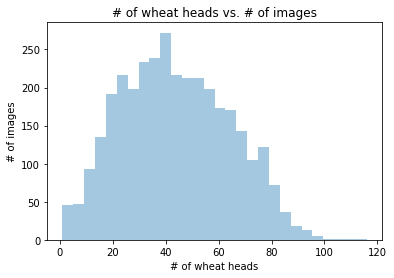

In [ ]:
sns.distplot(train_df['image_id'].value_counts(), kde=False)
plt.xlabel('# of wheat heads')
plt.ylabel('# of images')
plt.title('# of wheat heads vs. # of images')
plt.show()

In [ ]:
# Separating out the coordinates
train_df[['x_min','y_min', 'width', 'height']] = pd.DataFrame([ast.literal_eval(x) for x in train_df.bbox.tolist()], index= train_df.index)
train_df = train_df[['image_id', 'bbox', 'source', 'x_min', 'y_min', 'width', 'height']]
train_df

,image_id,bbox,source,x_min,y_min,width,height
0,b6ab77fd7,"[834.0, 222.0, 56.0, 36.0]",usask_1,834.0,222.0,56.0,36.0
1,b6ab77fd7,"[226.0, 548.0, 130.0, 58.0]",usask_1,226.0,548.0,130.0,58.0
2,b6ab77fd7,"[377.0, 504.0, 74.0, 160.0]",usask_1,377.0,504.0,74.0,160.0
3,b6ab77fd7,"[834.0, 95.0, 109.0, 107.0]",usask_1,834.0,95.0,109.0,107.0
4,b6ab77fd7,"[26.0, 144.0, 124.0, 117.0]",usask_1,26.0,144.0,124.0,117.0
...,...,...,...,...,...,...,...
147788,5e0747034,"[64.0, 619.0, 84.0, 95.0]",arvalis_2,64.0,619.0,84.0,95.0
147789,5e0747034,"[292.0, 549.0, 107.0, 82.0]",arvalis_2,292.0,549.0,107.0,82.0
147790,5e0747034,"[134.0, 228.0, 141.0, 71.0]",arvalis_2,134.0,228.0,141.0,71.0
147791,5e0747034,"[430.0, 13.0, 184.0, 79.0]",arvalis_2,430.0,13.0,184.0,79.0


# **Distribution of size of bounding boxes**

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


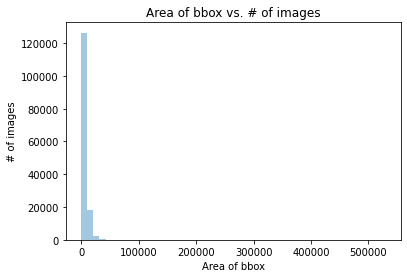

In [ ]:
sns.distplot(train_df['width'] * train_df['height'], kde=False)
plt.xlabel('Area of bbox')
plt.ylabel('# of images')
plt.title('Area of bbox vs. # of images')
plt.show()

# **Visualizing a few training images without bounding**

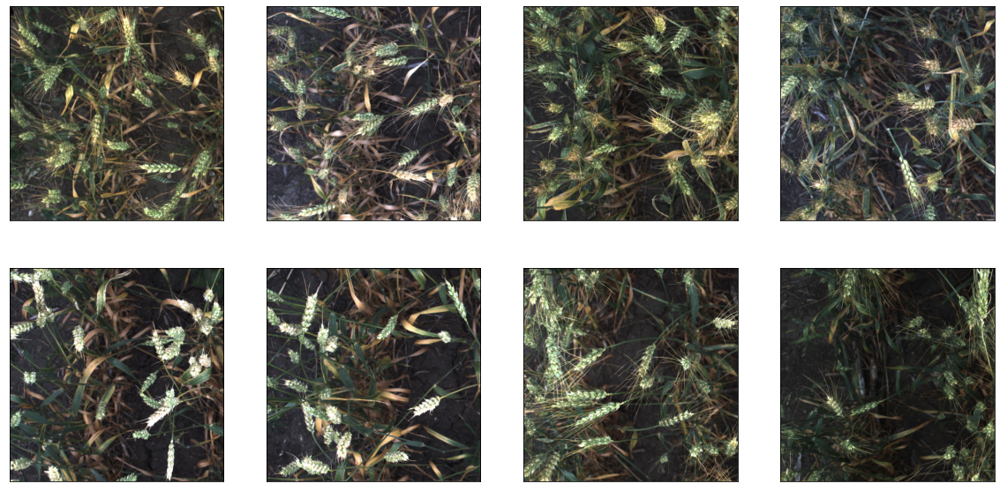

In [ ]:
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
count=0
for row in ax:
    for col in row:
        img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", train_df["image_id"].unique()[count])}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        col.imshow(img)
        count += 1
plt.show()

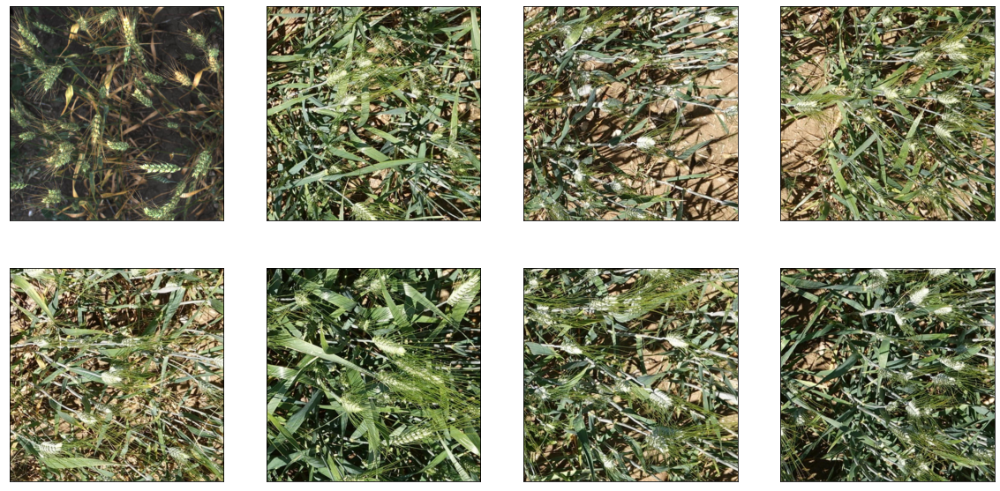

In [ ]:
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
count=0
for row in ax:
    for col in row:
        img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", train_df["image_id"].unique()[-count])}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        col.imshow(img)
        count += 1
plt.show()

# **Now let's visualize a few training images with bounding boxes**

In [ ]:
##bounding box for image_id
def get_bbox(image_id, df, col, color='white'):
    bboxes = df[df['image_id'] == image_id]
    
    for i in range(len(bboxes)):
        # Create a Rectangle patch
        rect = patches.Rectangle(
            (bboxes['x_min'].iloc[i], bboxes['y_min'].iloc[i]),
            bboxes['width'].iloc[i], 
            bboxes['height'].iloc[i], 
            linewidth=2, 
            edgecolor=color, 
            facecolor='none')
        

        # Add the patch to the Axes
        col.add_patch(rect)

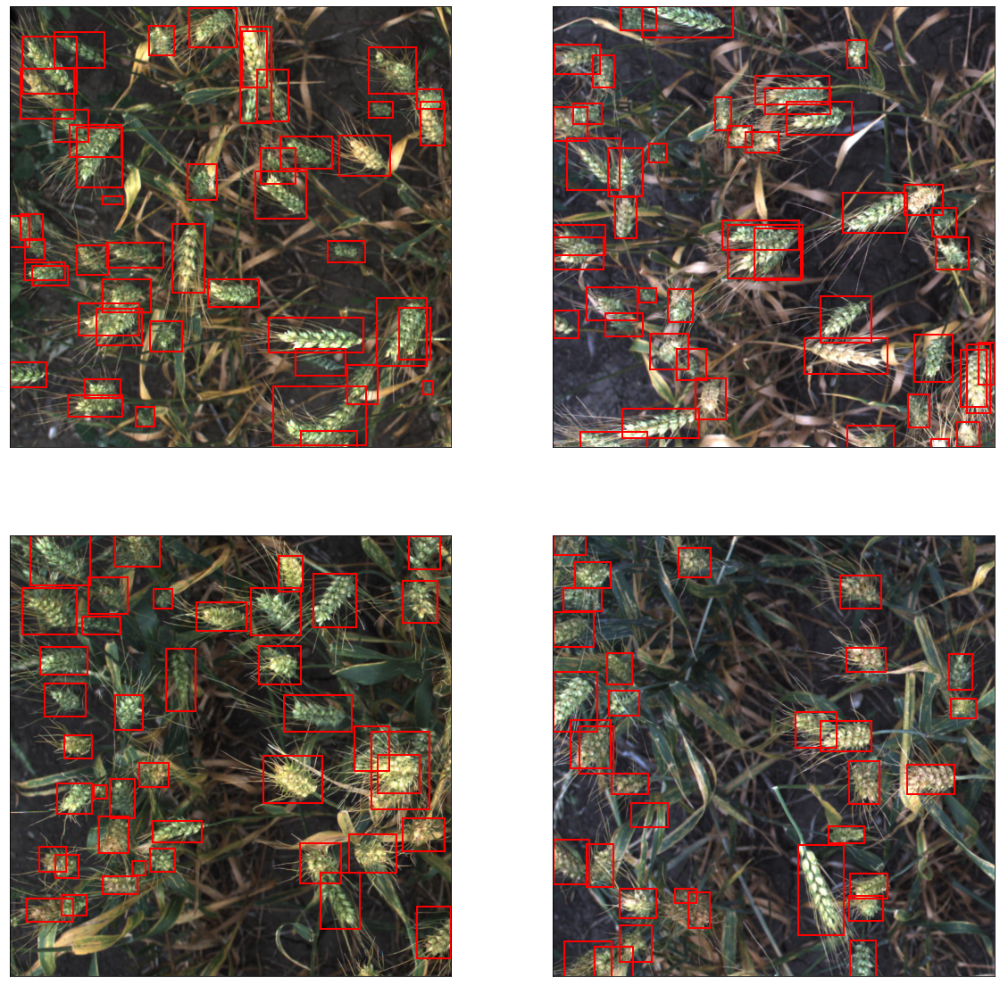

In [ ]:
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
count=0
for row in ax:
    for col in row:
        img_id = train_df["image_id"].unique()[count]
        img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", img_id)}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        get_bbox(img_id, train_df, col, color='red')
        
        col.imshow(img)
        count += 1
plt.show()

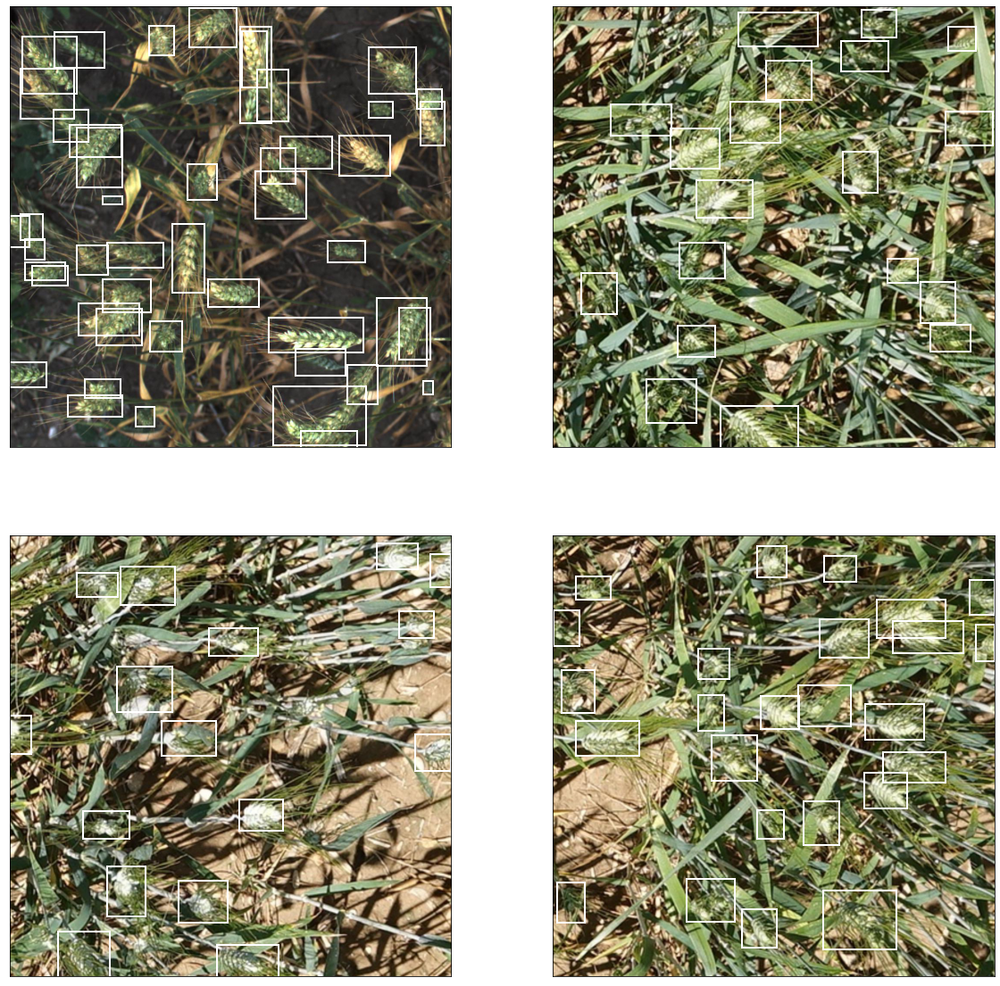

In [ ]:
#few more samples
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
count=0
for row in ax:
    for col in row:
        img_id = train_df["image_id"].unique()[-count]
        img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", img_id)}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        get_bbox(img_id, train_df, col)
        col.imshow(img)
        count += 1
plt.show()

# **Image with highest number of wheat heads**

[]

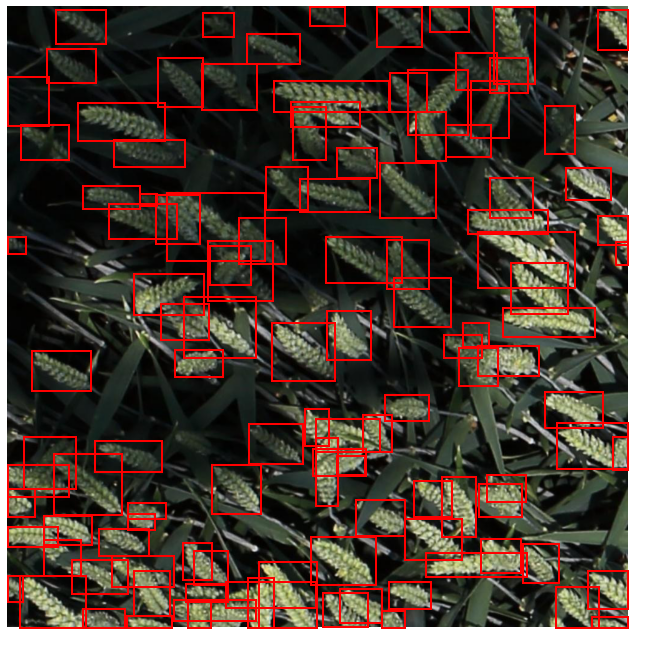

In [ ]:
image_id = (train_df['image_id'].value_counts() == 116).index[0]
img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", image_id)}.jpg')

fig, ax = plt.subplots(1, figsize=(12, 12))

ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')
get_bbox(image_id, train_df, ax, color='red')
ax.imshow(img)
plt.plot()

# **Some of the images without any wheat head**

In [ ]:
all_images = os.listdir(os.path.join(BASE_DIR, 'data/train'))
all_images = set([x[:-4] for x in all_images])

images_with_bbox = set(list(train_df['image_id']))

images_without_bbox = list(all_images - images_with_bbox)

In [ ]:
print(f'Total number of images without wheat heads: {len(images_without_bbox)}')

Total number of images without wheat heads: 48


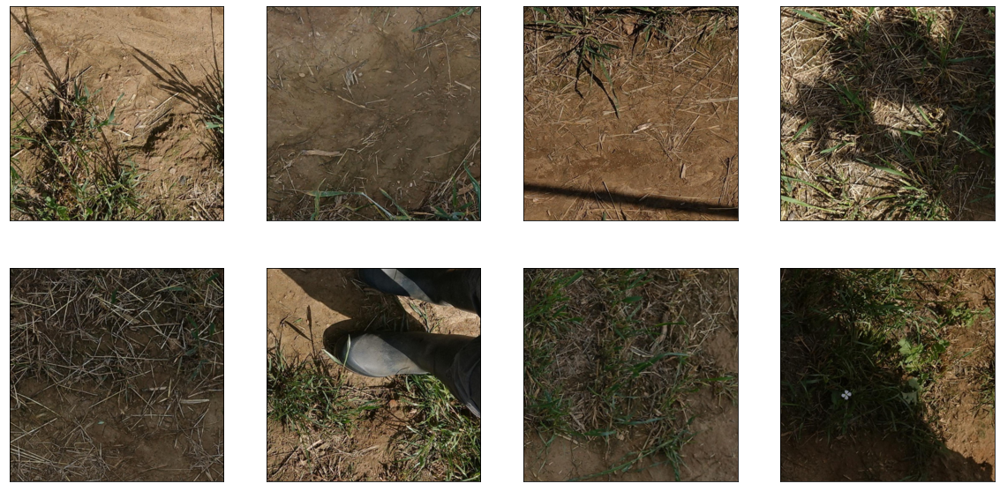

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
count=20
for row in ax:
    for col in row:
        img_id = images_without_bbox[count]
        img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", img_id)}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        col.imshow(img)
        count += 1
plt.show()

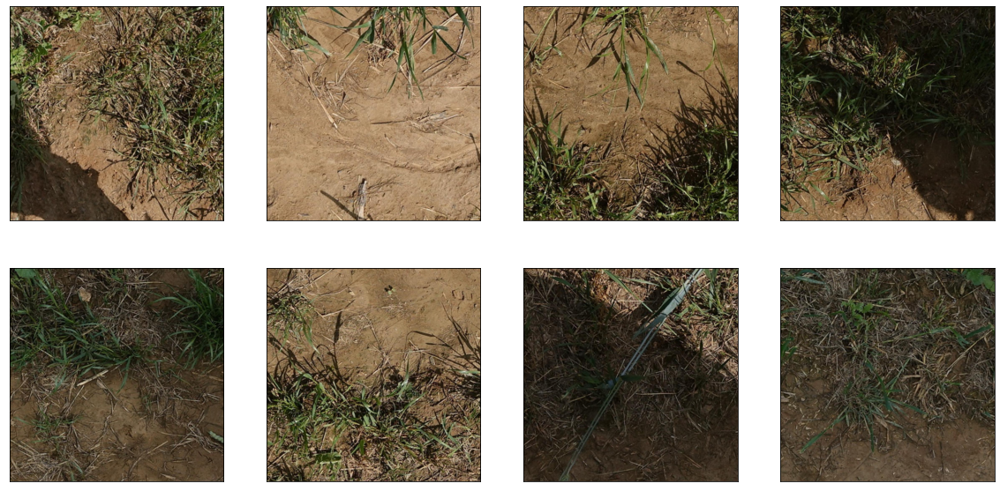

In [ ]:
#Some more samples
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
count = 0
for row in ax:
    for col in row:
        img_id = images_without_bbox[-count]
        img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", img_id)}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        col.imshow(img)
        count += 1

In [ ]:
# Serialize `train_df` to a .csv file
train_df.to_csv(os.path.join(BASE_DIR, 'train_df.csv'), index=False)

# **GLOBAL WHEAT DETECTION Pytorch**

In [ ]:
!pip install pydicom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.0 MB 32.0 MB/s 


In [ ]:
#importing libararies 
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import torch
import torchvision
import torchvision.transforms as T
from collections import defaultdict, deque
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
import ast
from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SequentialSampler

import cv2
import os,sys,matplotlib,re
from PIL import Image
from skimage import exposure
from pydicom.pixel_data_handlers.util import apply_voi_lut
import matplotlib.pyplot as plt
import matplotlib.image as immg

import warnings
warnings.filterwarnings("ignore")

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
path = '/content/drive/MyDrive/Wheat-Data/GWD_512_image_resized/'
train_df = pd.read_csv('/content/drive/MyDrive/Wheat-Data/train.csv')
train_df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [ ]:
#separating coordinates of images 
train_df['x_min'] = -1
train_df['y_min'] = -1
train_df['w'] = -1
train_df['h'] = -1

train_df[['x_min', 'y_min', 'w', 'h']] = np.stack(train_df['bbox'].apply(lambda x: ast.literal_eval(x)))
train_df.drop(columns=['bbox'], inplace=True)
train_df['x_min'] = train_df['x_min'].astype(np.float)
train_df['y_min'] = train_df['y_min'].astype(np.float)
train_df['w'] = train_df['w'].astype(np.float)
train_df['h'] = train_df['h'].astype(np.float)
train_df['x_max'] = train_df['x_min']+train_df['w']
train_df['y_max'] = train_df['y_min']+train_df['h']

In [ ]:
train_df.head()

,image_id,width,height,source,x_min,y_min,w,h,x_max,y_max
0,b6ab77fd7,1024,1024,usask_1,834.0,222.0,56.0,36.0,890.0,258.0
1,b6ab77fd7,1024,1024,usask_1,226.0,548.0,130.0,58.0,356.0,606.0
2,b6ab77fd7,1024,1024,usask_1,377.0,504.0,74.0,160.0,451.0,664.0
3,b6ab77fd7,1024,1024,usask_1,834.0,95.0,109.0,107.0,943.0,202.0
4,b6ab77fd7,1024,1024,usask_1,26.0,144.0,124.0,117.0,150.0,261.0


In [ ]:
df = train_df.copy()

In [ ]:
df['x_min'] = df['x_min']*512/1024
df['x_max'] = np.ceil(df['x_max']*512/1024)
df['y_min'] = df['y_min']*512/1024
df['y_max'] = np.ceil(df['y_max']*512/1024)

In [ ]:
df.describe()

,width,height,x_min,y_min,w,h,x_max,y_max
count,147793.0,147793.0,147793.000000,147793.000000,147793.00000,147793.000000,147793.000000,147793.000000
mean,1024.0,1024.0,236.190816,237.693453,84.43506,76.927306,278.644185,276.395682
std,0.0,0.0,151.777783,150.407754,35.55345,33.853186,151.134693,149.457607
min,1024.0,1024.0,0.000000,0.000000,1.00000,1.000000,1.000000,1.000000
25%,1024.0,1024.0,101.500000,106.500000,62.00000,55.000000,146.000000,147.000000
50%,1024.0,1024.0,237.500000,238.500000,78.00000,71.000000,282.000000,278.000000
75%,1024.0,1024.0,368.500000,368.500000,100.00000,91.000000,412.000000,407.000000
max,1024.0,1024.0,511.500000,511.500000,987.00000,714.000000,512.000000,512.000000


**Dataset**

In [ ]:
df = df.reset_index(drop=True)

In [ ]:
df_grp = df.groupby(['image_id'])
b_fea = ['x_min', 'y_min', 'x_max', 'y_max']

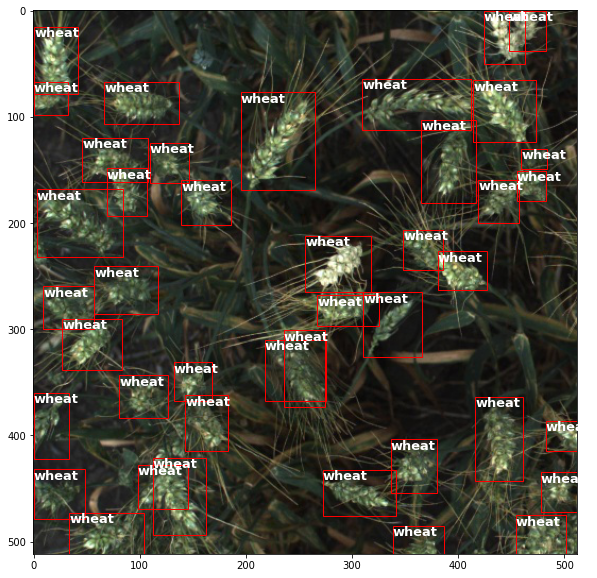

In [ ]:
name = df.image_id.unique()[9]
loc = path+name+'.jpg'
aaa = df_grp.get_group(name)
bbx = aaa.loc[:,b_fea]
img = immg.imread(loc)
fig,ax = plt.subplots(figsize=(18,10))
ax.imshow(img,cmap='binary')
for i in range(len(bbx)):
    box = bbx.iloc[i].values
    x,y,w,h = box[0], box[1], box[2]-box[0], box[3]-box[1]
    rect = matplotlib.patches.Rectangle((x,y),w,h,linewidth=1,edgecolor='r',facecolor='none',)
    ax.text(*box[:2], "wheat", verticalalignment='top', color='white', fontsize=13, weight='bold')
    ax.add_patch(rect)
plt.show()

In [ ]:
class WheatDataset(object):
    def __init__(self, df, IMG_DIR, transforms=None):
        # select only those classes that have boxes
        
        self.df = df
        self.img_dir = IMG_DIR
        self.image_ids = self.df['image_id'].unique().tolist()
        self.transforms = transforms
        
    def __len__(self):
        return len(self.image_ids)
    
    
    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        records = self.df[self.df['image_id'] == image_id]
        image = cv2.imread(self.img_dir+image_id+".jpg",cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        
        boxes = records[['x_min', 'y_min', 'x_max', 'y_max']].to_numpy()
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        labels = torch.ones((records.shape[0],), dtype=torch.int64)
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        target['image_id'] = torch.tensor([idx])
        target['area'] = torch.as_tensor(area, dtype=torch.float32)
        target['iscrowd'] = torch.zeros((records.shape[0],), dtype=torch.int64)
    
        if self.transforms:
            sample = {
                'image': image,
                'bboxes': target['boxes'],
                'labels': labels
            }
            sample = self.transforms(**sample)
            image = sample['image']
            
            target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1, 0)

        return torch.tensor(image), target, image_id

In [ ]:
#Transforms
IMG_SIZE = (512,512)

In [ ]:
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
def get_train_transform():
    return A.Compose([
        A.Flip(0.5),
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

In [ ]:
img_dir = "/content/drive/MyDrive/Wheat-Data/GWD_512_image_resized/"

In [ ]:
WDS = WheatDataset(df, img_dir ,get_train_transform())

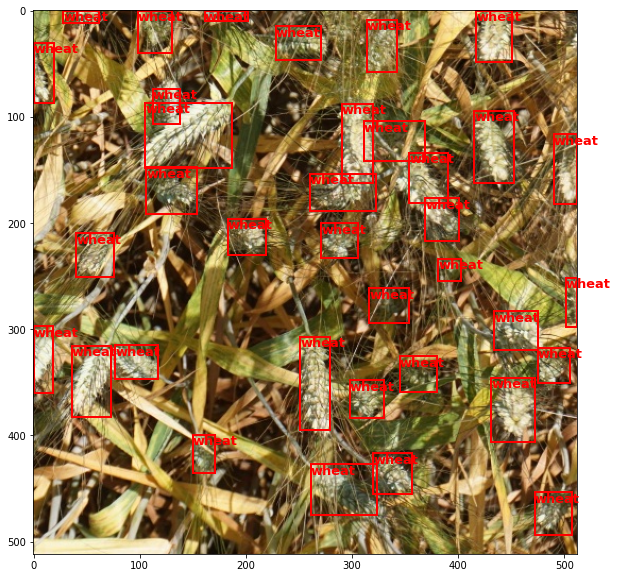

In [ ]:
#Checking a Dataset Sample
import random
img, tar,_ = WDS[random.randint(0,1000)]
bbox = tar['boxes'].numpy()
fig,ax = plt.subplots(figsize=(18,10))
ax.imshow(img.permute(1,2,0).cpu().numpy())
for i in range(len(bbox)):
    box = bbox[i]
    x,y,w,h = box[0], box[1], box[2]-box[0], box[3]-box[1]
    rect = matplotlib.patches.Rectangle((x,y),w,h,linewidth=2,edgecolor='r',facecolor='none',)
    ax.text(*box[:2], "wheat", verticalalignment='top', color='red', fontsize=13, weight='bold')
    ax.add_patch(rect)
plt.show()

In [ ]:
image_ids = df['image_id'].unique()
valid_ids = image_ids[-665:]
train_ids = image_ids[:-665]
valid_df = df[df['image_id'].isin(valid_ids)]
train_df = df[df['image_id'].isin(train_ids)]
train_df.shape,valid_df.shape

((122787, 10), (25006, 10))

In [ ]:
#DataLoader
def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = WheatDataset(train_df,img_dir , get_train_transform())
valid_dataset = WheatDataset(valid_df,img_dir, get_valid_transform())


# split the dataset in train and test set
indices = torch.randperm(len(train_dataset)).tolist()

train_data_loader = DataLoader(
    train_dataset,
    batch_size=8,
    shuffle=False,
    num_workers=4,
    collate_fn=collate_fn
)

valid_data_loader = DataLoader(
    valid_dataset,
    batch_size=8,
    shuffle=False,
    num_workers=4,
    collate_fn=collate_fn
)

**Training**

In [ ]:
num_classes = 2  # 1 class (wheat) + background
# load a model; pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

In [ ]:
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)
#lr_scheduler = None

In [ ]:
#Averager
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

In [ ]:
# the function takes the original prediction and the iou threshold.
def apply_nms(orig_prediction, iou_thresh=0.2):
    
    # torchvision returns the indices of the bboxes to keep
    keep = torchvision.ops.nms(orig_prediction['boxes'], orig_prediction['scores'], iou_thresh)
    
    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    
    return final_prediction

In [ ]:
num_epochs = 1

In [ ]:
loss_hist = Averager()
best_epoch = 0
min_loss = sys.maxsize
for epoch in range(num_epochs):
    loss_hist.reset()
    tk = tqdm(train_data_loader)
    model.train();
    for images, targets, image_ids in tk:
        
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        loss_hist.send(loss_value)

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        
        tk.set_postfix(train_loss=loss_value)
    tk.close()
    
    # update the learning rate
    if lr_scheduler is not None:
        lr_scheduler.step()

    print(f"Epoch #{epoch} loss: {loss_hist.value}") 
    
    if loss_hist.value<min_loss:
        print("Better model found at epoch {0} with {1:0.5f} loss value".format(epoch,loss_hist.value))
        torch.save(model.state_dict(), f"model_state_epoch_{epoch}.pth")
        min_loss = loss_hist.value
        best_epoch = epoch
    #validation 
    model.eval();
    with torch.no_grad():
        tk = tqdm(valid_data_loader)
        for images, targets, image_ids in tk:
        
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            val_output = model(images)
            val_output = [{k: v.to('cpu') for k, v in t.items()} for t in val_output]
            IOU = []
            for j in range(len(val_output)):
                val_out = apply_nms(val_output[j])
                a,b = val_out['boxes'].cpu().detach(), targets[j]['boxes'].cpu().detach()
                chk = torchvision.ops.box_iou(a,b)
                res = np.nanmean(chk.sum(axis=1)/(chk>0).sum(axis=1))
                IOU.append(res)
            tk.set_postfix(IoU=np.mean(IOU))
        tk.close()
        
model.load_state_dict(torch.load(f"./model_state_epoch_{best_epoch}.pth"));

  0%|          | 0/339 [00:00<?, ?it/s]

Epoch #0 loss: 0.8738599482088313
Better model found at epoch 0 with 0.87386 loss value


  0%|          | 0/84 [00:00<?, ?it/s]

In [ ]:
model.load_state_dict(torch.load(f"./model_state_epoch_{best_epoch}.pth"));

In [ ]:
#Validation And Prediction
img,target,_ = valid_dataset[50]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]
    
print('predicted #boxes: ', len(prediction['boxes']))
print('real #boxes: ', len(target['boxes']))

predicted #boxes:  57
real #boxes:  53


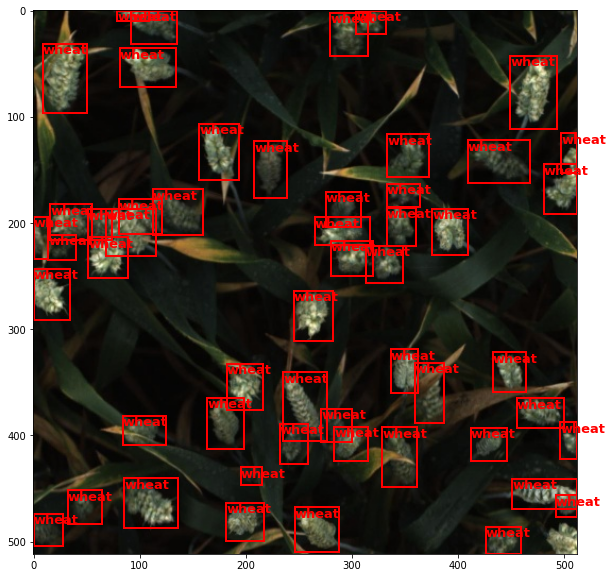

In [ ]:
bbox = target['boxes'].numpy()
fig,ax = plt.subplots(1,figsize=(18,10))
ax.imshow(img.permute(1,2,0).cpu().numpy())
for i in range(len(bbox)):
    box = bbox[i]
    x,y,w,h = box[0], box[1], box[2]-box[0], box[3]-box[1]
    rect = matplotlib.patches.Rectangle((x,y),w,h,linewidth=2,edgecolor='r',facecolor='none',)
    ax.text(*box[:2], "wheat", verticalalignment='top', color='red', fontsize=13, weight='bold')
    ax.add_patch(rect)
plt.show()

In [ ]:
def plot_valid(img,prediction,nms=True,detect_thresh=0.5):
    fig,ax = plt.subplots(figsize=(18,10))
    val_img = img.permute(1,2,0).cpu().numpy()
    ax.imshow(val_img)
    nms_prediction = apply_nms(prediction, iou_thresh=0.2) if nms else prediction
    val_scores = nms_prediction['scores'].cpu().detach().numpy()
    bbox = nms_prediction['boxes'].cpu().detach().numpy()
    for i in range(len(bbox)):
        if val_scores[i]>=detect_thresh:
            box = bbox[i]
            x,y,w,h = box[0], box[1], box[2]-box[0], box[3]-box[1]
            rect = matplotlib.patches.Rectangle((x,y),w,h,linewidth=2 ,edgecolor='r',facecolor='none',)
            ax.text(*box[:2], "wheat {0:.3f}".format(val_scores[i]), verticalalignment='top', color='white', fontsize=12, weight='bold')
            ax.add_patch(rect)
    plt.show()

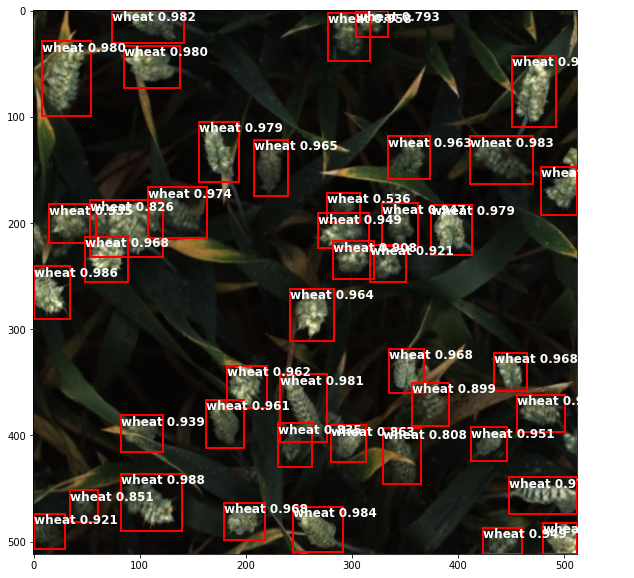

In [ ]:
#Predictions on valid set
plot_valid(img,prediction)